# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [73]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os
import chart_studio.plotly
#from plotly import plotly
import plotly.offline as offline
#import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [2]:
#Sample data of 50000 is taken from train_data.csv to avoid memory error
project_data_df = pd.read_csv('train_data.csv')
project_data_sort=project_data_df.sort_values(by=['id'])
project_data = project_data_sort.head(50000)

resource_data = pd.read_csv('resources.csv')

In [6]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (50000, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [7]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [3]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [4]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [10]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [11]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
25693,34858,p000002,638363148ff34bcbe004fcaeb7c9a544,Mrs.,HI,2016-09-20 21:19:53,Grades 6-8,21st Century Learners Across the Ocean,Our native Hawaiian students of the valley hai...,We like to combine 21st century learning with ...,NaN,NaN,My students need headphones and supplemental s...,1,1,History_Civics,History_Geography,Our native Hawaiian students of the valley hai...
47025,89122,p000003,c8e40d76c14dbc404075f9013d5cd166,Mrs.,NY,2016-06-23 09:21:59,Grades PreK-2,Kindergarten Loves Literacy Centers,My students are excited for their first year i...,Our students love literacy centers! Every morn...,NaN,NaN,My students need phonemic awareness learning c...,5,1,Literacy_Language,Literature_Writing,My students are excited for their first year i...


In [12]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [13]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)


Our native Hawaiian students of the valley hail from a tight knit community.  Many are from low socioeconomic backgrounds. Yet they remain a proud people not inclined to ask for hand outs. They   are genuine souls who face trials and tribulations on a daily basis. \r\n\r\nOur students come from predominately low socio-economic backgrounds with over 80% of our students receiving free or reduced lunch.  We also have a population of students who are homeless. \r\n\r\nIn spite of their struggles they come to school with positive attitudes and a smile. They are genuine, caring, and always thankful. Many aspire to attend college and will work hard to make that happen.We like to combine 21st century learning with traditional learning.  This allows our students the time to acclimate to the changes and become active 21st century learners.  \r\n\r\nAs 21st century learners, the students require access to a variety of tools and technology. Use of technology serves to engage the students with vary

In [14]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [15]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

Art experiences are important in the elementary school classroom. I have seen, in the last several years, the majority of my student lack exposure to basic art techniques. Cutting, painting, even using glue properly is very awkward for them. \r\n\r\nI would like watercolor paint sets for my students. Watercolor sets provide beautiful options for expression in a format that allows for teaching about how to use the tools of an artist. \r\n\r\nI hope through providing tools for my students to create art it will enrich their appreciation and awareness of the beauties around us; those created by nature and by the human hand. \r\n\r\nArt expression is important for elementary aged children. Over the past several years my students have come to me lacking basic art skills such as cutting, painting, and gluing. Academics that are testable have overshadowed and all but wiped out the nontestable learning. Time children spend making and communicating through art has all but disappeared. \r\n\r\nI 

In [16]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

Art experiences are important in the elementary school classroom. I have seen, in the last several years, the majority of my student lack exposure to basic art techniques. Cutting, painting, even using glue properly is very awkward for them.     I would like watercolor paint sets for my students. Watercolor sets provide beautiful options for expression in a format that allows for teaching about how to use the tools of an artist.     I hope through providing tools for my students to create art it will enrich their appreciation and awareness of the beauties around us; those created by nature and by the human hand.     Art expression is important for elementary aged children. Over the past several years my students have come to me lacking basic art skills such as cutting, painting, and gluing. Academics that are testable have overshadowed and all but wiped out the nontestable learning. Time children spend making and communicating through art has all but disappeared.     I would like my st

In [17]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

Art experiences are important in the elementary school classroom I have seen in the last several years the majority of my student lack exposure to basic art techniques Cutting painting even using glue properly is very awkward for them I would like watercolor paint sets for my students Watercolor sets provide beautiful options for expression in a format that allows for teaching about how to use the tools of an artist I hope through providing tools for my students to create art it will enrich their appreciation and awareness of the beauties around us those created by nature and by the human hand Art expression is important for elementary aged children Over the past several years my students have come to me lacking basic art skills such as cutting painting and gluing Academics that are testable have overshadowed and all but wiped out the nontestable learning Time children spend making and communicating through art has all but disappeared I would like my students to have watercolor paint s

In [18]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [19]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [00:55<00:00, 903.41it/s]


In [17]:
# after preprocesing
preprocessed_essays[20000]

'art experiences important elementary school classroom i seen last several years majority student lack exposure basic art techniques cutting painting even using glue properly awkward i would like watercolor paint sets students watercolor sets provide beautiful options expression format allows teaching use tools artist i hope providing tools students create art enrich appreciation awareness beauties around us created nature human hand art expression important elementary aged children over past several years students come lacking basic art skills cutting painting gluing academics testable overshadowed wiped nontestable learning time children spend making communicating art disappeared i would like students watercolor paint sets by using watercolors children able learn gently hold paint brush apply paint varying degrees pressure color watercolors provide beautiful options teachable format i sure students would love illustrating also able learn brush painting techniques nannan'

In [20]:
np.savetxt("preprocessed_essaysDT.csv", preprocessed_essays, fmt='%5s',delimiter=",")

In [11]:
np.savetxt("preprocessed_essaysDT30k.csv", preprocessed_essays, fmt='%5s',delimiter=",")

<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [21]:
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for sentence in tqdm(project_data['project_title'].values):
    title = decontracted(sentence)
    title = title.replace('\\r', ' ')
    title = title.replace('\\"', ' ')
    title = title.replace('\\n', ' ')
    title = re.sub('[^A-Za-z0-9]+', ' ', title)
    # https://gist.github.com/sebleier/554280
    title = ' '.join(e for e in title.split() if e not in stopwords)
    preprocessed_titles.append(title.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 50000/50000 [00:02<00:00, 18922.95it/s]


In [22]:
np.savetxt("preprocessed_titlesDT.csv", preprocessed_titles, fmt='%5s',delimiter=",")

In [13]:
np.savetxt("preprocessed_titlesDT30k.csv", preprocessed_essays, fmt='%5s',delimiter=",")

In [5]:
project_data['clean_essays'] = pd.read_csv('preprocessed_essaysDT.csv')#load from preprocessed csv
project_data['clean_titles'] = pd.read_csv('preprocessed_titlesDT.csv')# load from preprocessed csv

## 1.5 Preparing data for models

In [21]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

### 1.5.1 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

In [5]:
# we use count vectorizer to convert the values into one 
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
categories_one_hot = vectorizer.fit_transform(project_data['clean_categories'].values)
print(vectorizer.get_feature_names())
print("Shape of matrix after one hot encodig ",categories_one_hot.shape)

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix after one hot encodig  (50000, 9)


In [6]:
# we use count vectorizer to convert the values into one 
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
sub_categories_one_hot = vectorizer.fit_transform(project_data['clean_subcategories'].values)
print(vectorizer.get_feature_names())
print("Shape of matrix after one hot encodig ",sub_categories_one_hot.shape)

['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
Shape of matrix after one hot encodig  (50000, 30)


In [7]:
project_data['project_grade_category'] = project_data['project_grade_category'].str.replace(" ","_")

### 1.5.2 Vectorizing Text data

#### 1.5.2.1 Bag of words

In [0]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
text_bow = vectorizer.fit_transform(preprocessed_essays)
print("Shape of matrix after one hot encodig ",text_bow.shape)

Shape of matrix after one hot encodig  (109248, 16623)


In [0]:
# you can vectorize the title also 
# before you vectorize the title make sure you preprocess it

#### 1.5.2.2 TFIDF vectorizer

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
text_tfidf = vectorizer.fit_transform(preprocessed_essays)
print("Shape of matrix after one hot encodig ",text_tfidf.shape)

Shape of matrix after one hot encodig  (109248, 16623)


#### 1.5.2.3 Using Pretrained Models: Avg W2V

In [8]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

In [8]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [0]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors.append(vector)

print(len(avg_w2v_vectors))
print(len(avg_w2v_vectors[0]))

100%|████████████████████████████████████████████████████████████████████████| 109248/109248 [00:32<00:00, 3369.33it/s]


109248
300


#### 1.5.2.3 Using Pretrained Models: TFIDF weighted W2V

In [0]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_essays)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [0]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)

print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))

100%|█████████████████████████████████████████████████████████████████████████| 109248/109248 [03:36<00:00, 503.77it/s]


109248
300


In [0]:
# Similarly you can vectorize for title also

### 1.5.3 Vectorizing Numerical features

In [0]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [0]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

price_scalar = StandardScaler()
price_scalar.fit(project_data['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
price_standardized = price_scalar.transform(project_data['price'].values.reshape(-1, 1))

In [0]:
price_standardized

array([[0.00098843, 0.00191166, 0.00330448, ..., 0.00153418, 0.00046704,
        0.00070265]])

### 1.5.4 Merging all the above features

- we need to merge all the numerical vectors i.e catogorical, text, numerical vectors

In [0]:
print(categories_one_hot.shape)
print(sub_categories_one_hot.shape)
print(text_bow.shape)
print(price_standardized.shape)

(109248, 9)
(109248, 30)
(109248, 16623)
(109248, 1)


In [0]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
X = hstack((categories_one_hot, sub_categories_one_hot, text_bow, price_standardized))
X.shape

(109248, 16663)

In [0]:
# please write all the code with proper documentation, and proper titles for each subsection
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features + project_title(BOW) + preprocessed_eassay (BOW)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features + project_title(TFIDF)+  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 3</font>: categorical, numerical features + project_title(AVG W2V)+  preprocessed_eassay (AVG W2V)</li>
            <li><font color='red'>Set 4</font>: categorical, numerical features + project_title(TFIDF W2V)+  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <br>
    <li><strong>Hyper paramter tuning (best `depth` in range [1, 5, 10, 50, 100, 500, 100], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>Find the best hyper paramter using k-fold cross validation or simple cross validation data</li>
    <li>Use gridsearch cv or randomsearch cv or you can also write your own for loops to do this task of hyperparameter tuning</li> 
        </ul>
    </li>
    <br>
    <li><strong>Graphviz</strong>
        <ul>
    <li>Visualize your decision tree with Graphviz. It helps you to understand how a decision is being made, given a new vector.</li>
    <li>Since feature names are not obtained from word2vec related models, visualize only BOW & TFIDF decision trees using Graphviz</li>
    <li>Make sure to print the words in each node of the decision tree instead of printing its index.</li>
    <li>Just for visualization purpose, limit max_depth to 2 or 3 and either embed the generated images of graphviz in your notebook, or directly upload them as .png files.</li>                
        </ul>
    </li>
    <br>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='train_cv_auc.JPG' width=300px></li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='confusion_matrix.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud <a href='https://www.geeksforgeeks.org/generating-word-cloud-python/' with the words of eassy text of these `false positive data points`>WordCloud</a></li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
    <br>
    <li><strong>[Task-2]</strong>
        <ul>
    <li> Select 5k best features from features of <font color='red'>Set 2</font> using<a href='https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html'>`feature_importances_`</a>, discard all the other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM), you need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3</li>
        </ul>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

<h1>2. Decision Tree </h1>

<h2>2.1 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [8]:
#project_data['clean_essays'] = pd.read_csv('preprocessed_essaysDT.csv')#load from preprocessed csv
#project_data['clean_titles'] = pd.read_csv('preprocessed_titlesDT.csv')# load from preprocessed csv
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')
y = project_data['project_is_approved'].values
project_data.drop(['project_essay_1'], axis=1, inplace=True)
project_data.drop(['project_essay_2'], axis=1, inplace=True)
project_data.drop(['project_essay_3'], axis=1, inplace=True)
project_data.drop(['project_essay_4'], axis=1, inplace=True)
project_data.drop(['project_is_approved'], axis=1, inplace=True)
X = project_data

# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y)

In [7]:
X_train['clean_essays']=pd.read_csv('train_preprocessed_essaysSVM.csv')

In [27]:
X_train['clean_titles']=pd.read_csv('train_preprocessed_titlesSVM.csv')

In [28]:
X_test['clean_titles']=pd.read_csv('test_preprocessed_titlesSVM.csv')

In [9]:
X_test['clean_essays']=pd.read_csv('test_preprocessed_essaysSVM.csv')

In [25]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)
X_train.head(5)

(33500, 17) (33500,)
(16500, 17) (16500,)


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,clean_essays,clean_titles,price,quantity
2890,65300,p006831,adf8d1bc1452e4f421a775a28bb60227,Ms.,NM,2016-09-22 20:40:03,Grades PreK-2,Wobble and Focus\r\n,My students need wobble chairs so they can mov...,0,Literacy_Language,Literature_Writing,I have an active class of 14 boys and 7 girls....,our schools home diverse group students even t...,let go osmo,119.90,2
40568,141563,p096421,b00b0452f290eccaab6840a93b3318f2,Mrs.,MA,2016-08-25 19:50:39,Grades 3-5,Hola iPads!,My students need an iPad in the classroom so t...,7,Literacy_Language,ESL,My students all come from the poorest neighbor...,NaN,NaN,615.98,3
48107,30051,p114463,ba33506c1559bef843a76962294ed217,Ms.,CA,2016-09-01 00:00:19,Grades 9-12,Down With Rows: Flexible Seating Is the Future!,My students need standing desks (5) and bean b...,1,Health_Sports History_Civics,Health_Wellness SocialSciences,The students of Del Norte County High School a...,a book gift open garrison keillor my students ...,students families reading success,220.50,10
17822,25632,p042497,f6c70b09b5a3873e874a123cc7a25021,Mrs.,IL,2016-11-02 14:20:19,Grades 3-5,Let Your Imagination Go Lego,My students need legos in order to design and ...,1,Literacy_Language Music_Arts,Literature_Writing VisualArts,Our school is a STEM school. Our concentration...,my first grade classroom dynamic diverse group...,making my classroom more visually engaging,309.24,5
3459,126611,p008173,12498875eea61259650b621cee563464,Ms.,NC,2016-09-24 10:15:30,Grades 6-8,We Have a Sweet Tooth,"My students need treats, drinks, assorted copy...",49,Math_Science,Mathematics,I teach a wonderful group of sixth grade stude...,i work 850 energetic middle school students ti...,mission possible a need read,216.03,15


# 2.2 Make Data Model Ready: encoding numerical, categorical features

ONE HOT ENCODING-CATEGORIES

In [9]:
# we use count vectorizer to convert the categories values of train , test and CV values into one hot encoded features
from sklearn.feature_extraction.text import CountVectorizer
vectorizer1 = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False,
binary=True)
vectorizer1.fit(X_train['clean_categories'].values)
print(vectorizer1.get_feature_names())
categories_one_hot_train = vectorizer1.transform(X_train['clean_categories'].values)
categories_one_hot_test = vectorizer1.transform(X_test['clean_categories'].values)
print("Shape of matrix after one hot encoding train ",categories_one_hot_train.shape)
print("Shape of matrix after one hot encoding test",categories_one_hot_test.shape)

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix after one hot encoding train  (33500, 9)
Shape of matrix after one hot encoding test (16500, 9)


ONE HOT ENCODING-SUB CATEGORIES

In [10]:
# we use count vectorizer to convert the subcategories values of train, test and cv into one hot encoded features
vectorizer2 = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary
=True)
vectorizer2.fit(X_train['clean_subcategories'].values)
#print(vectorizer2.get_feature_names())
sub_categories_one_hot_train = vectorizer2.transform(X_train['clean_subcategories'].values)
sub_categories_one_hot_test = vectorizer2.transform(X_test['clean_subcategories'].values)
print("Shape of matrix after one hot encoding train ",sub_categories_one_hot_train.shape)
print("Shape of matrix after one hot encoding test",sub_categories_one_hot_test.shape)

Shape of matrix after one hot encoding train  (33500, 30)
Shape of matrix after one hot encoding test (16500, 30)


ONE HOT ENCODING-SCHOOL STATE

In [11]:
# we use count vectorizer to convert the School State values of train, test and cv into one hot encoded features
vectorizer3= CountVectorizer(vocabulary=None, lowercase=False, binary=True)
vectorizer3.fit(X_train['school_state'].values)
#print(vectorizer3.get_feature_names())
state_one_hot_train = vectorizer3.transform(X_train['school_state'].values)
state_one_hot_test = vectorizer3.transform(X_test['school_state'].values)
print("Shape of matrix after one hot encoding train ",state_one_hot_train.shape)
print("Shape of matrix after one hot encoding test ",state_one_hot_test.shape)

Shape of matrix after one hot encoding train  (33500, 51)
Shape of matrix after one hot encoding test  (16500, 51)


ONE HOT ENCODING - TEACHER PREFIX

In [12]:
X_train['teacher_prefix']=X_train['teacher_prefix'].fillna(" ")

In [13]:
# we use count vectorizer to convert the teacher prefix values of train, test and cv into one hot encoded features
vectorizer4 = CountVectorizer(vocabulary=None, lowercase=False, binary=True)
vectorizer4.fit(X_train['teacher_prefix'].values.astype('U'))
print(vectorizer4.get_feature_names())
#prefix_one_hot = vectorizer4.transform(project_data[project_data.teacher_prefix.notnull()])
prefix_one_hot_train = vectorizer4.transform(X_train['teacher_prefix'].values.astype('U'))
prefix_one_hot_test = vectorizer4.transform(X_test['teacher_prefix'].values.astype('U'))
#prefix_one_hot_cv = vectorizer4.transform(X_cv['teacher_prefix'].values.astype('U'))
print("Shape of matrix after one hot encoding train ",prefix_one_hot_train.shape)
print("Shape of matrix after one hot encoding test ",prefix_one_hot_test.shape)

['Dr', 'Mr', 'Mrs', 'Ms', 'Teacher']
Shape of matrix after one hot encoding train  (33500, 5)
Shape of matrix after one hot encoding test  (16500, 5)


ONE HOT ENCODING - PROJECT GRADE CATEGORY

In [14]:
project_data['project_grade_category'] = project_data['project_grade_category'].str.replace(" ","_")

In [15]:
# we use count vectorizer to convert the project grade category values of train, test and cv into one hot encoded features
#vectorizer5 = CountVectorizer(vocabulary=None, lowercase=False, binary=True)
my_counter = Counter()
for project_grade in project_data['project_grade_category'].values:
    my_counter.update(project_grade.split())
project_grade_cat_dict = dict(my_counter)
sorted_project_grade_cat_dict = dict(sorted(project_grade_cat_dict.items(), key=lambda kv: kv[1]))
vectorizer5 = CountVectorizer(vocabulary=list(sorted_project_grade_cat_dict.keys()), lowercase=False, binary=True)
#project_data_df[project_data_df.project_grade_category.notnull()]
vectorizer5.fit(X_train['project_grade_category'].values.astype('U'))
#print(vectorizer5.get_feature_names())
grade_cat_one_hot_train = vectorizer5.transform(X_train['project_grade_category'].values.astype('U'))
grade_cat_one_hot_test = vectorizer5.transform(X_test['project_grade_category'].values.astype('U'))
print("Shape of matrix after one hot encoding train",grade_cat_one_hot_train.shape)
print("Shape of matrix after one hot encoding test",grade_cat_one_hot_test.shape)

Shape of matrix after one hot encoding train (33500, 4)
Shape of matrix after one hot encoding test (16500, 4)


<h2>Vectorizing Numerical Features</h2>

Vectorizing - Price

In [16]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikitlearn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
# Suggestion provided by applied AI team to do normalization to avoid negative values
from sklearn.preprocessing import Normalizer
price_scalar = Normalizer()
price_scalar.fit(X_train['price'].values.reshape(-1,1)) 
# finding the mean and standard deviation of this data
#print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")
price_standardized_train = price_scalar.transform(X_train['price'].values.reshape(-1, 1))
price_standardized_test = price_scalar.transform(X_test['price'].values.reshape(-1, 1))
#price_standardized_cv = price_scalar.transform(X_cv['price'].values.reshape(-1, 1))
print("Shape of matrix after standardisation train",price_standardized_train.shape)
print("Shape of matrix after standardisation test",price_standardized_test.shape)
#print("Shape of matrix after standardization cv",price_standardized_cv.shape)

Shape of matrix after standardisation train (33500, 1)
Shape of matrix after standardisation test (16500, 1)


Vectorizing - Quantity

In [17]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikitlearn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import Normalizer
quantity_scalar = Normalizer()
quantity_scalar.fit(X_train['quantity'].values.reshape(-1,1)) 
quantity_standardized_train = quantity_scalar.transform(X_train['quantity'].values.reshape(-1, 1))
quantity_standardized_test = quantity_scalar.transform(X_test['quantity'].values.reshape(-1, 1))
#quantity_standardized_cv = quantity_scalar.transform(X_cv['quantity'].values.reshape(-1, 1))
print("Shape of matrix after standardisation train",quantity_standardized_train.shape)
print("Shape of matrix after standardisation test",quantity_standardized_test.shape)

Shape of matrix after standardisation train (33500, 1)
Shape of matrix after standardisation test (16500, 1)


Vectorizing - teacher_number_of_previously_posted_projects

In [18]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikitlearn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import Normalizer
prev_proj_scalar = Normalizer()
prev_proj_scalar.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)) 
prev_proj_standardized_train = prev_proj_scalar.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
prev_proj_standardized_test = prev_proj_scalar.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
#prev_proj_standardized_cv = prev_proj_scalar.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
print("Shape of matrix after standardisation train",prev_proj_standardized_train.shape)
print("Shape of matrix after standardisation test",prev_proj_standardized_test.shape)

Shape of matrix after standardisation train (33500, 1)
Shape of matrix after standardisation test (16500, 1)


In [36]:
project_data['clean_titles']=pd.read_csv('preprocessed_titlesDT.csv')

In [6]:
title_word_count = []
for a in project_data["clean_titles"].values.astype('U') :
    #fr=a.astype(str).str.split()
    #str=a.split()
    #print(fr)
    b = len(a.split())
    title_word_count.append(b)
project_data["title_word_count"] = title_word_count
#project_data.head(5)

In [7]:
essay_word_count = []
for a in project_data["clean_essays"].values.astype('U') :
    #fr=a.astype(str).str.split()
    #str=a.split()
    #print(fr)
    b = len(a.split())
    essay_word_count.append(b)
project_data["essay_word_count"] = essay_word_count
#project_data.head(5)

In [30]:
from sklearn.preprocessing import StandardScaler
essay_scalar = StandardScaler()

essay_scalar.fit(X_train['title_word_count'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
title_word_count_train = essay_scalar.transform(X_train['title_word_count'].values.reshape(-1, 1))

essay_scalar.fit(X_train['title_word_count'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
title_word_count_test = essay_scalar.transform(X_test['title_word_count'].values.reshape(-1, 1))



print(title_word_count_train.shape, y_train.shape)
print(title_word_count_test.shape, y_test.shape)


C:\Program Files\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


(33500, 1) (33500,)
(16500, 1) (16500,)


In [31]:
normalizer = Normalizer()

normalizer.fit(X_train['title_word_count'].values.reshape(1,-1))

title_word_count_train = normalizer.transform(X_train['title_word_count'].values.reshape(1,-1))
#title_word_count_cv = normalizer.transform(X_cv['title_word_count'].values.reshape(1,-1))
title_word_count_test = normalizer.transform(X_test['title_word_count'].values.reshape(1,-1))

print("After vectorizations")
print(title_word_count_train.shape, y_train.shape)
#print(title_word_count_cv.shape, y_cv.shape)
print(title_word_count_test.shape, y_test.shape)
print("="*100)

#bow_feature_names.append('title_word_count')
#feature_names_tfidf.append('title_count')

After vectorizations
(1, 33500) (33500,)
(1, 16500) (16500,)


In [36]:

title_word_count_test1=title_word_count_test.reshape(16500,1)
title_word_count_train1=title_word_count_train.reshape(33500,1)

In [34]:
tt=title_word_count_test.reshape(16500,1)

In [35]:
print(tt.shape)

(16500, 1)


In [37]:
normalizer = Normalizer()

normalizer.fit(X_train['essay_word_count'].values.reshape(1,-1))

essay_word_count_train = normalizer.transform(X_train['essay_word_count'].values.reshape(1,-1))

essay_word_count_test = normalizer.transform(X_test['essay_word_count'].values.reshape(1,-1))

print("After vectorizations")
print(essay_word_count_train.shape, y_train.shape)
#print(title_word_count_cv.shape, y_cv.shape)
print(essay_word_count_test.shape, y_test.shape)
print("="*100)

#bow_feature_names.append('title_word_count')
#feature_names_tfidf.append('title_count')

After vectorizations
(1, 33500) (33500,)
(1, 16500) (16500,)


In [38]:
essay_word_count_test1=essay_word_count_test.reshape(16500,1)
essay_word_count_train1=essay_word_count_train.reshape(33500,1)

<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

BOW-Project Essays

In [21]:
#https://www.kaggle.com/shashank49/knn-on-donors-choose
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_bow_essay = CountVectorizer()
vectorizer_bow_essay.fit(X_train['clean_essays'].values.astype('U')) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_bow = vectorizer_bow_essay.transform(X_train['clean_essays'].values.astype('U'))
X_test_essay_bow = vectorizer_bow_essay.transform(X_test['clean_essays'].values.astype('U'))

print("After vectorizations")
print(X_train_essay_bow.shape, y_train.shape)
print(X_test_essay_bow.shape, y_test.shape)

After vectorizations
(33500, 26448) (33500,)
(16500, 26448) (16500,)


BOW-Project Titles

In [23]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_bow_titles = CountVectorizer()
vectorizer_bow_titles.fit(X_train['clean_titles'].values.astype('U')) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_titles_bow = vectorizer_bow_titles.transform(X_train['clean_titles'].values.astype('U'))
X_test_titles_bow = vectorizer_bow_titles.transform(X_test['clean_titles'].values.astype('U'))

print("After vectorizations")
print(X_train_titles_bow.shape, y_train.shape)
print(X_test_titles_bow.shape, y_test.shape)

After vectorizations
(33500, 6743) (33500,)
(16500, 6743) (16500,)


TFIDF-Project Essays

In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_tfidf_essay = TfidfVectorizer(min_df=10,ngram_range=(2, 2),max_features=5000)
vectorizer_tfidf_essay.fit(X_train['clean_essays'].values.astype('U')) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_tfidf = vectorizer_tfidf_essay.transform(X_train['clean_essays'].values.astype('U'))
X_test_essay_tfidf = vectorizer_tfidf_essay.transform(X_test['clean_essays'].values.astype('U'))
print(X_train_essay_tfidf.shape)
print(X_test_essay_tfidf.shape)

(33500, 5000)
(16500, 5000)


In [18]:
from scipy import sparse
sparse.save_npz("X_train_essay_tfidf.npz", X_train_essay_tfidf)
sparse.save_npz("X_test_essay_tfidf.npz", X_test_essay_tfidf)

In [16]:
from scipy import sparse
#X_train_essay_tfidf=sparse.load_npz("X_train_essay_tfidf30k.npz")
X_test_essay_tfidf=sparse.load_npz("X_test_essay_tfidf.npz")

TFIDF-Project Titles

In [18]:
vectorizer_tfidf_titles = TfidfVectorizer(min_df=5)
vectorizer_tfidf_titles.fit(X_train['clean_titles'].values.astype('U')) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_titles_tfidf = vectorizer_tfidf_titles.transform(X_train['clean_titles'].values.astype('U'))
X_test_titles_tfidf = vectorizer_tfidf_titles.transform(X_test['clean_titles'].values.astype('U'))
print("Train shape:",X_train_titles_tfidf.shape)
print("Test shape:",X_test_titles_tfidf.shape)

Train shape: (33500, 1627)
Test shape: (16500, 1627)


Avg W2V -Project Essays

In [18]:
essay_avg_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['clean_essays'].values.astype('U')): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    essay_avg_w2v_vectors_train.append(vector)
print(len(essay_avg_w2v_vectors_train))
print(len(essay_avg_w2v_vectors_train[0]))

100%|██████████████████████████████████| 33500/33500 [00:11<00:00, 2994.13it/s]


33500
300


In [19]:
essay_avg_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['clean_essays'].values.astype('U')): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    essay_avg_w2v_vectors_test.append(vector)
print(len(essay_avg_w2v_vectors_test))
print(len(essay_avg_w2v_vectors_test[0]))

100%|██████████████████████████████████| 16500/16500 [00:05<00:00, 2942.55it/s]


16500
300


Avg W2V -Project Titles

In [20]:
titles_avg_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['clean_titles'].values.astype('U')): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    titles_avg_w2v_vectors_train.append(vector)
print(len(titles_avg_w2v_vectors_train))
print(len(titles_avg_w2v_vectors_train[0]))

100%|█████████████████████████████████| 33500/33500 [00:00<00:00, 37979.69it/s]


33500
300


In [21]:
titles_avg_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['clean_titles'].values.astype('U')): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    titles_avg_w2v_vectors_test.append(vector)
print(len(titles_avg_w2v_vectors_test))
print(len(titles_avg_w2v_vectors_test[0]))

100%|█████████████████████████████████| 16500/16500 [00:00<00:00, 36910.64it/s]


16500
300


TFIDF W2V - Project Essays

In [18]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(pd.read_csv('preprocessed_essaysDT.csv'))
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [19]:
essay_tfidf_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['clean_essays'].values.astype('U')): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    essay_tfidf_w2v_vectors_train.append(vector)
print(len(essay_tfidf_w2v_vectors_train))
print(len(essay_tfidf_w2v_vectors_train[0]))

100%|██████████████████████████████████| 33500/33500 [00:22<00:00, 1477.82it/s]


33500
300


In [20]:
essay_tfidf_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['clean_essays'].values.astype('U')): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    essay_tfidf_w2v_vectors_test.append(vector)
print(len(essay_tfidf_w2v_vectors_test))
print(len(essay_tfidf_w2v_vectors_test[0]))

100%|██████████████████████████████████| 16500/16500 [00:11<00:00, 1444.21it/s]


16500
300


TFIDF W2V Project Titles

In [21]:
title_tfidf_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['clean_titles'].values.astype('U')): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    title_tfidf_w2v_vectors_train.append(vector)
print(len(title_tfidf_w2v_vectors_train))
print(len(title_tfidf_w2v_vectors_train[0]))

100%|█████████████████████████████████| 33500/33500 [00:00<00:00, 52970.44it/s]


33500
300


In [22]:
title_tfidf_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['clean_titles'].values.astype('U')): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    title_tfidf_w2v_vectors_test.append(vector)
print(len(title_tfidf_w2v_vectors_test))
print(len(title_tfidf_w2v_vectors_test[0]))

100%|█████████████████████████████████| 16500/16500 [00:00<00:00, 42414.04it/s]


16500
300


<h1>Decision Tree</h1>




# [Task-1] Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets
# Set 1: categorical, numerical features + project_title(BOW) + preprocessed_eassay (BOW)

In [39]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((title_word_count_train1,essay_word_count_train1,categories_one_hot_train,sub_categories_one_hot_train,state_one_hot_train,prefix_one_hot_train,grade_cat_one_hot_train,price_standardized_train,quantity_standardized_train,prev_proj_standardized_train,X_train_essay_bow,X_train_titles_bow)).tocsr()
X_te = hstack((title_word_count_test1,essay_word_count_test1,categories_one_hot_test,sub_categories_one_hot_test,state_one_hot_test,prefix_one_hot_test,grade_cat_one_hot_test,price_standardized_test,quantity_standardized_test,prev_proj_standardized_test,X_test_essay_bow,X_test_titles_bow)).tocsr()
#np.savetxt("X_tr.csv", X_tr, delimiter=",")
#np.savetxt("X_cr.csv", X_cr, delimiter=",")
#np.savetxt("X_te.csv", X_te, fmt='%5s',delimiter=",")
from scipy import sparse
#Save the sparse matrix to avoid memory error
sparse.save_npz("X_tr_DT.npz", X_tr)
sparse.save_npz("X_te_DT.npz", X_te)
print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_te.shape, y_test.shape)

Final Data matrix
(33500, 33295) (33500,)
(16500, 33295) (16500,)


In [40]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import math
DT = DecisionTreeClassifier(class_weight='balanced')
parameters = {'max_depth':[1, 5, 10, 50, 100, 500], 'min_samples_split': [5, 10, 100, 500]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(X_tr, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']


In [41]:
#display the best params
best_params = clf.best_estimator_
print("Best max_depth value for bow encoded text features is,",best_params)

Best max_depth value for bow encoded text features is, DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


# min_samples_split=500

In [32]:
parameters = {'max_depth':[1, 5, 10, 50, 100, 500, 1000]}
np.log(parameters['max_depth'])

array([0.        , 1.60943791, 2.30258509, 3.91202301, 4.60517019,
       6.2146081 , 6.90775528])

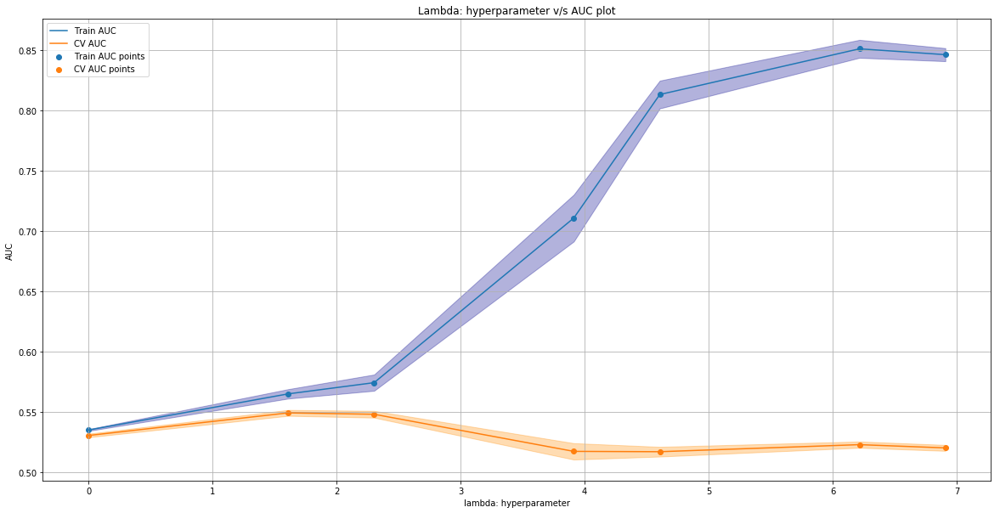

In [42]:
#of
DT = DecisionTreeClassifier()
logAlpha = []
parameters = {'max_depth':[1, 5, 10, 50, 100, 500, 1000], 'min_samples_split': [500]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(X_tr, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']
plt.figure(figsize=(20,10))
plt.plot(np.log(parameters['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.3,color='darkblue')
plt.plot(np.log(parameters['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.3,color='darkorange')
plt.scatter(np.log(parameters['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(parameters['max_depth']), cv_auc, label='CV AUC points')
plt.legend()
plt.xlabel("lambda: hyperparameter")
plt.ylabel("AUC")
plt.title("Lambda: hyperparameter v/s AUC plot")
plt.grid()

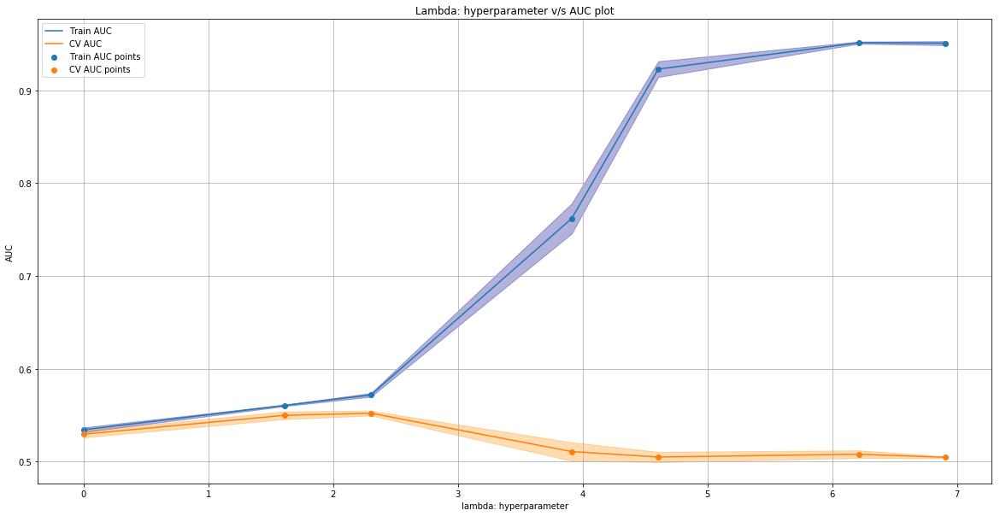

In [22]:
#old
DT = DecisionTreeClassifier()
logAlpha = []
parameters = {'max_depth':[1, 5, 10, 50, 100, 500, 1000], 'min_samples_split': [10]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(X_tr, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']
plt.figure(figsize=(20,10))
plt.plot(np.log(parameters['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.3,color='darkblue')
plt.plot(np.log(parameters['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.3,color='darkorange')
plt.scatter(np.log(parameters['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(parameters['max_depth']), cv_auc, label='CV AUC points')
plt.legend()
plt.xlabel("lambda: hyperparameter")
plt.ylabel("AUC")
plt.title("Lambda: hyperparameter v/s AUC plot")
plt.grid()

# Observation:-

# Best Hyperparameter(max_depth)= 10 when min_samples_split=500

In [43]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs
    
    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your cr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

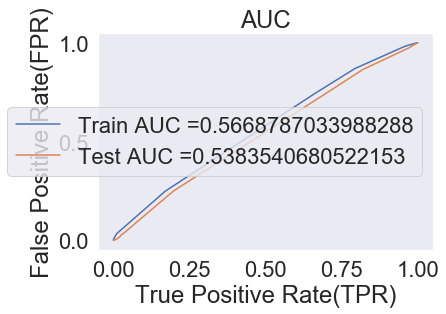

In [74]:
#of
# https://scikitlearn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.metrics import roc_curve, auc
model = DecisionTreeClassifier(min_samples_split = 500, max_depth= 5, class_weight='balanced')
model.fit(X_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positiveclass
# not the predicted outputs
y_train_pred = model.predict_proba(X_tr)[:,1]
y_test_pred = model.predict_proba(X_te)[:,1]
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC")
plt.grid()

# Observation:-

# Train AUC=60%
# Test AUC=54%
    

In [45]:
# code copied from https://github.com/harrismohammed/DonorsChoose.org---LogisticRegression
y_pred_new=[]
def predict(proba, fpr, tpr, threshold):
    t = threshold[np.argmax(fpr*(1-tpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    #print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

Accuracy on train set: 68.221%
Precision on train set: 0.863
Recall on train set: 0.743
F1-Score on train set: 0.799
Confusion Matrix of train set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 273 ms


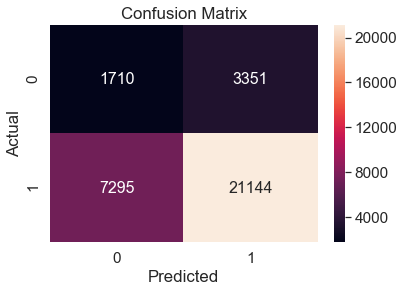

In [75]:
%%time
#off
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_train_pred,train_fpr, train_tpr, tr_thresholds)
#print(y_pred_new)
classes = ['Actual', 'Predicted']
print("Accuracy on train set: %0.3f%%"%(accuracy_score(y_train, y_pred_new)*100))
print("Precision on train set: %0.3f"%(precision_score(y_train, y_pred_new)))
print("Recall on train set: %0.3f"%(recall_score(y_train, y_pred_new)))
print("F1-Score on train set: %0.3f"%(f1_score(y_train, y_pred_new)))
print("Confusion Matrix of train set:\n [ [TN  FP]\n [FN TP] ]\n")
cm =confusion_matrix(y_train, y_pred_new)
df_cm = pd.DataFrame(cm, range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

Accuracy on train set: 53.749%
Precision on train set: 0.887
Recall on train set: 0.522
F1-Score on train set: 0.657
Confusion Matrix of train set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 385 ms


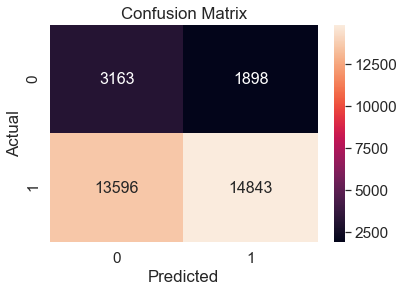

In [25]:
#old
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_train_pred,train_fpr, train_tpr, tr_thresholds)
#print(y_pred_new)
classes = ['Actual', 'Predicted']
print("Accuracy on train set: %0.3f%%"%(accuracy_score(y_train, y_pred_new)*100))
print("Precision on train set: %0.3f"%(precision_score(y_train, y_pred_new)))
print("Recall on train set: %0.3f"%(recall_score(y_train, y_pred_new)))
print("F1-Score on train set: %0.3f"%(f1_score(y_train, y_pred_new)))
print("Confusion Matrix of train set:\n [ [TN  FP]\n [FN TP] ]\n")
cm =confusion_matrix(y_train, y_pred_new)
df_cm = pd.DataFrame(cm, range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

Accuracy on test set: 67.097%
Precision on test set: 0.857
Recall on test set: 0.735
F1-Score on test set: 0.791
Confusion Matrix of test set:
 [ [TN  FP]
 [FN TP] ]



Text(0.5, 2.5, 'Predicted')

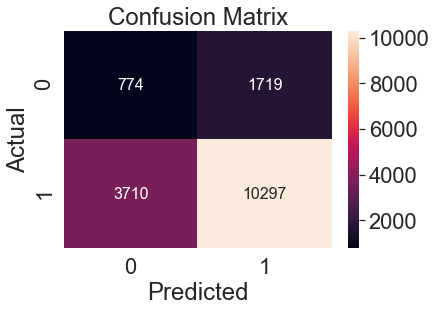

In [78]:
#new
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new=predict(y_test_pred,test_fpr, test_tpr, tr_thresholds)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred_new)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred_new)))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred_new)))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred_new)))
print("Confusion Matrix of test set:\n [ [TN  FP]\n [FN TP] ]\n")

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred_new), range(2),range(2))
sns.set(font_scale=2.0)#for label size
sns.heatmap(df_cm,annot=True,annot_kws={"size": 16},fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [53]:
#old
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_test_pred,test_fpr, test_tpr, tr_thresholds)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred_new)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred_new)))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred_new)))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred_new)))
print("Confusion Matrix of test set:\n [ [TN  FP]\n [FN TP] ]\n")

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred_new), range(2),range(2))
sns.set(font_scale=2.0)#for label size
sns.heatmap(df_cm,annot=True,annot_kws={"size": 16},fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

UsageError: Line magic function `%%time` not found.


Accuracy on test set: 73.158%
Precision on test set: 0.858
Recall on test set: 0.819
F1-Score on test set: 0.838
Confusion Matrix of test set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 240 ms


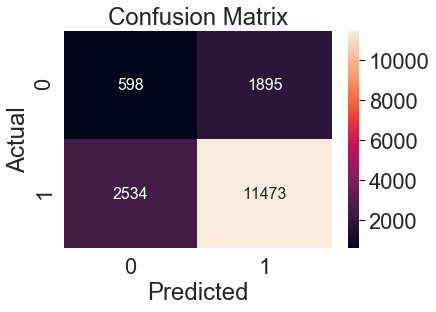

In [26]:
#old
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_test_pred,test_fpr, test_tpr, tr_thresholds)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred_new)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred_new)))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred_new)))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred_new)))
print("Confusion Matrix of test set:\n [ [TN  FP]\n [FN TP] ]\n")

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred_new), range(2),range(2))
sns.set(font_scale=2.0)#for label size
sns.heatmap(df_cm,annot=True,annot_kws={"size": 16},fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [48]:
# code used from https://github.com/philomath18/Decision-Tree---Donors-Choose
indices = []
test_predict = pd.DataFrame(predict(y_test_pred, te_thresholds, test_fpr, test_tpr))
test_actual = pd.DataFrame(y_test)

test_predict.columns = ['predicted_label']
test_actual.columns = ['actual_label']


test_predict.index = test_actual.index

df = test_actual.merge(test_predict, left_index=True, right_index=True)

dx = df[df['predicted_label']==1]
dy = dx[dx['actual_label'] == 0]
df1 = pd.DataFrame(dy)

indices.extend(df1.index)
print(indices[0])

3


In [51]:
project_data['clean_essays']=pd.read_csv('preprocessed_essaysDT.csv')

In [49]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
text= []
for i  in range (0,len(indices)):
  text.append(project_data.clean_essays[indices[i]])
 
all_text = []

all_text.append(str(text))

all_text

["[nan, nan, nan, 'our students unique individuals come diverse backgrounds we many languages spoken school several students new country we title i school 50 students free reduced price lunch our students eager learn always need new challenging tasks brought we neighborhood school wonderful staff educators dedicated helping students learn grow our school budgets cut much years we used owl pellet dissection every year money tight year our 4th grade students always said one favorite memories fourth grade every year our 4th grade needs owl pellets gloves able dissect use science process skills observe classify bones find students work together carefully dissect see find using bone chart the books dvd used integrate literacy technology unit our students love engaging hands projects nannan', 'our school stem school our concentration science technology engineering mathematics our 3rd graders hands real world problem solvers my students enjoy engineering creating new things they constantly ex

# WordCloud for false positive data points

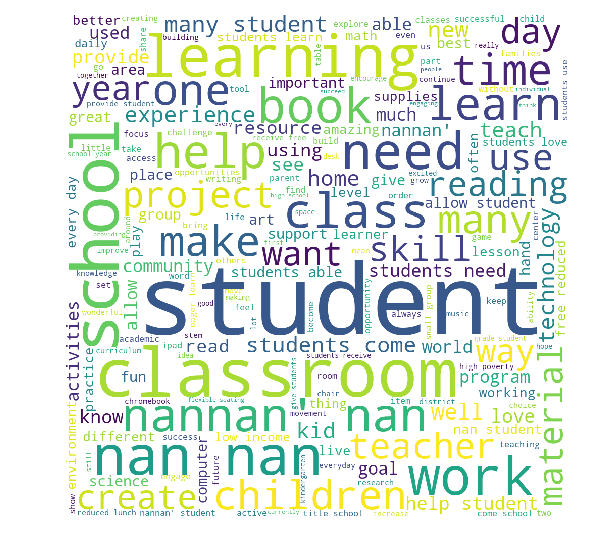

In [80]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
tn, fp, fn, tp = confusion_matrix(y_test, predict(y_test_pred, te_thresholds, test_fpr, test_tpr)).ravel()

from wordcloud import WordCloud


wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white',  
                min_font_size = 5).generate(all_text[0]) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

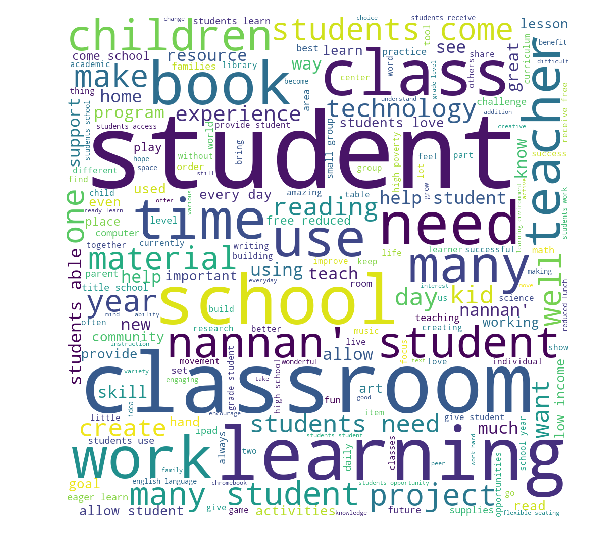

In [53]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
tn, fp, fn, tp = confusion_matrix(y_test, predict(y_test_pred, te_thresholds, test_fpr, test_tpr)).ravel()

from wordcloud import WordCloud


wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white',  
                min_font_size = 5).generate(all_text[0]) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

# Box Plot for false positive data points

In [81]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
def perf_measure(y_actual, y_hat):
    fp_index = []

    for i in range(len(y_hat)): 
        if y_hat[i]==1 and y_actual[i]!=y_hat[i]:
           fp_index.append(i)

    return(fp_index)

In [57]:
print(y_pred_new.shape)

NameError: name 'y_pred_new' is not defined

In [82]:
false_positives = perf_measure(y_test,y_pred_new)
len(false_positives)

1719

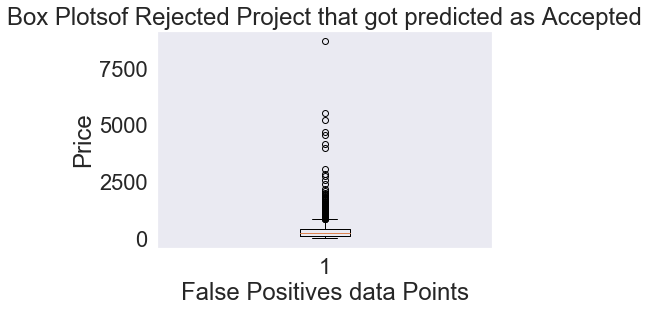

In [83]:
df2 = pd.DataFrame(X_test['price'])
df2_final = df2.iloc[false_positives,:]
plt.boxplot(df2_final.values)
plt.title('Box Plotsof Rejected Project that got predicted as Accepted')
plt.xlabel('False Positives data Points')
plt.ylabel('Price')
plt.grid()
plt.show()

# PDF Of false positive data points

In [84]:
df3 = pd.DataFrame(X_test['teacher_number_of_previously_posted_projects'])
df3_final = df3.iloc[false_positives,:]

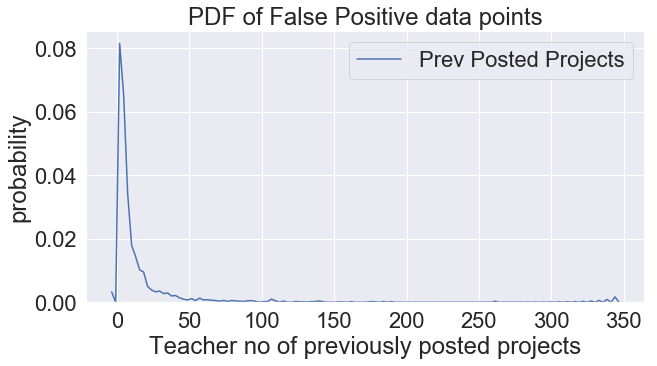

In [85]:
plt.figure(figsize=(10,5))
sns.distplot(df3_final.values, hist=False, label="Prev Posted Projects")
plt.title('PDF of False Positive data points')
plt.xlabel('Teacher no of previously posted projects')
plt.ylabel('probability')
plt.legend()
plt.show()

In [87]:
bow_feature_names = []

for a in vectorizer1.get_feature_names():
    bow_feature_names.append(a);
    
for a in vectorizer2.get_feature_names():
    bow_feature_names.append(a);

for a in vectorizer3.get_feature_names():
    bow_feature_names.append(a);

for a in vectorizer4.get_feature_names():
    bow_feature_names.append(a);
    
for a in vectorizer5.get_feature_names():
    bow_feature_names.append(a);

bow_feature_names.append('Price');
bow_feature_names.append('Quantity');
bow_feature_names.append('teacher_number_of_previously_posted_projects');
for a in vectorizer_bow_essay.get_feature_names():
    bow_feature_names.append(a)
    
for a in vectorizer_bow_titles.get_feature_names():
    bow_feature_names.append(a)
bow_feature_names.append(essay_word_count)
bow_feature_names.append(title_word_count)
print(len(bow_feature_names))
    

33295


In [88]:
lst = []
lst.extend(y_train)
class_labels = []
for i in range(0,len(lst)):
    class_labels.append(str(lst[i]))

In [90]:
#https://stackoverflow.com/questions/27817994/visualizing-decision-tree-in-scikit-learn
#https://graphviz.readthedocs.io/en/stable/manual.html#subgraphs
import os 
os.environ["PATH"] += os.pathsep + r'C:\Users\65353400\Desktop\graphviz-2.38\release\bin'
import graphviz
from sklearn import tree
from graphviz import Source

dot_data = tree.export_graphviz(model, out_file=None, feature_names=bow_feature_names,class_names= class_labels, rounded=True, filled=True)
graph = graphviz.Source(dot_data) 
graph.render("Bow tree",view = True)

'Bow tree.pdf'

# Set 2: categorical, numerical features + project_title(TFIDF)+ preprocessed_eassay (TFIDF)

In [19]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((categories_one_hot_train,sub_categories_one_hot_train,state_one_hot_train,prefix_one_hot_train,grade_cat_one_hot_train,price_standardized_train,quantity_standardized_train,prev_proj_standardized_train,X_train_essay_tfidf,X_train_titles_tfidf)).tocsr()
#X_cr = hstack((categories_one_hot_cv,sub_categories_one_hot_cv,state_one_hot_cv,prefix_one_hot_cv,grade_cat_one_hot_cv,price_standardized_cv,quantity_standardized_cv,prev_proj_standardized_cv,X_cv_essay_tfidf,X_cv_titles_tfidf)).tocsr()
X_te = hstack((categories_one_hot_test,sub_categories_one_hot_test,state_one_hot_test,prefix_one_hot_test,grade_cat_one_hot_test,price_standardized_test,quantity_standardized_test,prev_proj_standardized_test,X_test_essay_tfidf,X_test_titles_tfidf)).tocsr()
#np.savetxt("X_tr.csv", X_tr, delimiter=",")
#np.savetxt("X_cr.csv", X_cr, delimiter=",")
#np.savetxt("X_te.csv", X_te, fmt='%5s',delimiter=",")
from scipy import sparse
#Save the sparse matrix to avoid memory error
sparse.save_npz("X_tr_tfidf_DT.npz", X_tr)
sparse.save_npz("X_te_tfidf_DT.npz", X_te)
print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_te.shape, y_test.shape)

Final Data matrix
(33500, 6729) (33500,)
(16500, 6729) (16500,)


In [21]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import math
DT = DecisionTreeClassifier()
parameters = {'max_depth':[1, 5, 10, 50, 100, 500], 'min_samples_split': [5, 10, 100, 500]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(X_tr, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']

In [22]:
#display the best params
best_params = clf.best_estimator_
print("Best max_depth value for bow encoded text features is,",best_params)

Best max_depth value for bow encoded text features is, DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=10,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


# Best min_samples_split=10

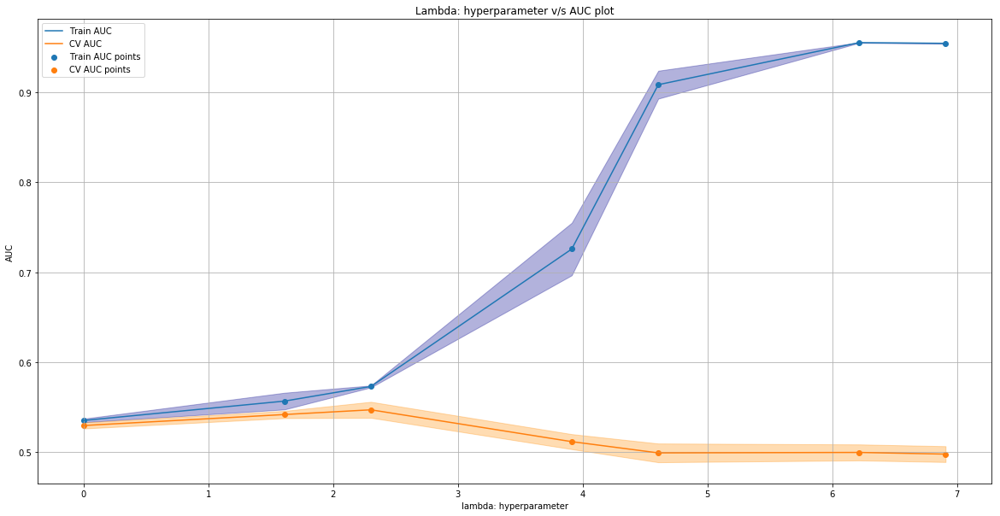

In [23]:
DT = DecisionTreeClassifier()
logAlpha = []
parameters = {'max_depth':[1, 5, 10, 50, 100, 500, 1000], 'min_samples_split': [10]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(X_tr, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']
plt.figure(figsize=(20,10))
plt.plot(np.log(parameters['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.3,color='darkblue')
plt.plot(np.log(parameters['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.3,color='darkorange')
plt.scatter(np.log(parameters['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(parameters['max_depth']), cv_auc, label='CV AUC points')
plt.legend()
plt.xlabel("lambda: hyperparameter")
plt.ylabel("AUC")
plt.title("Lambda: hyperparameter v/s AUC plot")
plt.grid()

# Observation:-

# Best Hyperparameter(max_depth)= 10 when min_samples_split=10

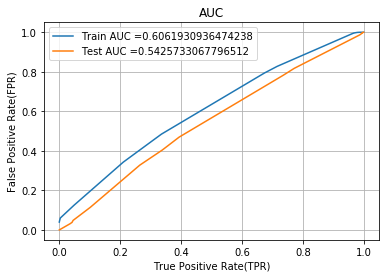

In [24]:
# https://scikitlearn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
model = DecisionTreeClassifier(min_samples_split = 10, max_depth= 10, class_weight='balanced')
model.fit(X_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positiveclass
# not the predicted outputs
y_train_pred = model.predict_proba(X_tr)[:,1]
y_test_pred = model.predict_proba(X_te)[:,1]
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC")
plt.grid()

# Observation

# Train AUC=60%
# Test AUC=54%

Accuracy on train set: 51.179%
Precision on train set: 0.890
Recall on train set: 0.485
F1-Score on train set: 0.628
Confusion Matrix of train set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 455 ms


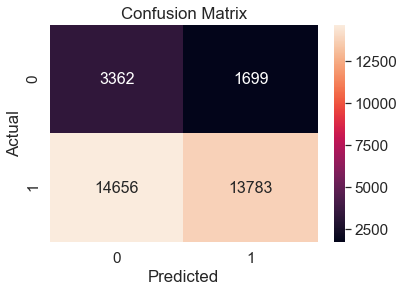

In [27]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_train_pred,train_fpr, train_tpr, tr_thresholds)
#print(y_pred_new)
classes = ['Actual', 'Predicted']
print("Accuracy on train set: %0.3f%%"%(accuracy_score(y_train, y_pred_new)*100))
print("Precision on train set: %0.3f"%(precision_score(y_train, y_pred_new)))
print("Recall on train set: %0.3f"%(recall_score(y_train, y_pred_new)))
print("F1-Score on train set: %0.3f"%(f1_score(y_train, y_pred_new)))
print("Confusion Matrix of train set:\n [ [TN  FP]\n [FN TP] ]\n")
cm =confusion_matrix(y_train, y_pred_new)
df_cm = pd.DataFrame(cm, range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

Accuracy on test set: 70.376%
Precision on test set: 0.857
Recall on test set: 0.782
F1-Score on test set: 0.818
Confusion Matrix of test set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 267 ms


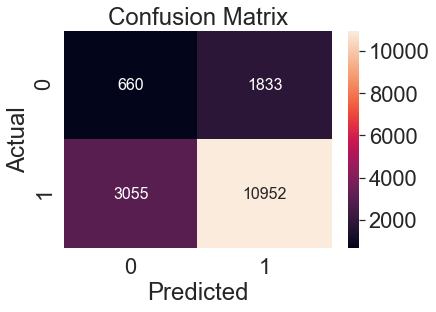

In [28]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_test_pred,test_fpr, test_tpr, tr_thresholds)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred_new)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred_new)))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred_new)))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred_new)))
print("Confusion Matrix of test set:\n [ [TN  FP]\n [FN TP] ]\n")

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred_new), range(2),range(2))
sns.set(font_scale=2.0)#for label size
sns.heatmap(df_cm,annot=True,annot_kws={"size": 16},fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

# WordCloud For false positive data points

In [29]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
indices = []
test_predict = pd.DataFrame(predict(y_test_pred, te_thresholds, test_fpr, test_tpr))
test_actual = pd.DataFrame(y_test)

test_predict.columns = ['predicted_label']
test_actual.columns = ['actual_label']


test_predict.index = test_actual.index

df = test_actual.merge(test_predict, left_index=True, right_index=True)

dx = df[df['predicted_label']==1]
dy = dx[dx['actual_label'] == 0]
df1 = pd.DataFrame(dy)

indices.extend(df1.index)
print(indices[0])

10


In [30]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
text= []
for i  in range (0,len(indices)):
  text.append(project_data.clean_essays[indices[i]])
 
all_text = []

all_text.append(str(text))

all_text

["[nan, 'the students school enjoy interacting challenging better better the students special care share go without something give students our school rural community we title i school 78 free reduced lunch high ell population we send food backpacks home several students weekend well offering food food pantry community the students district seem lost sense community years beginning build back improve we elementary district jr sr high school 200 yards apart we grades k 5 elementary 7 12 jr sr high school building the 6th graders classes buildings our district also developmental preschool located building campus i excited part positive changes taking place within building district community donating project get kids moving pe sport interested the students currently come pe ready move excited learn something new the students currently share basketballs wait line opportunity work skill donating allow student pe basketball working skills later teams created allow two games going simultaneou

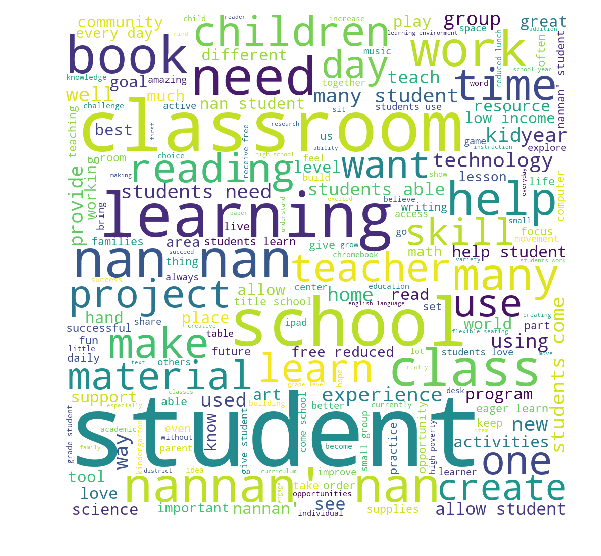

In [31]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
tn, fp, fn, tp = confusion_matrix(y_test, predict(y_test_pred, te_thresholds, test_fpr, test_tpr)).ravel()

from wordcloud import WordCloud


wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white',  
                min_font_size = 5).generate(all_text[0]) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

# Box Plot For false positive data points

In [32]:
def perf_measure(y_actual, y_hat):
    fp_index = []

    for i in range(len(y_hat)): 
        if y_hat[i]==1 and y_actual[i]!=y_hat[i]:
           fp_index.append(i)

    return(fp_index)

In [33]:
false_positives = perf_measure(y_test,y_pred_new)
len(false_positives)

1833

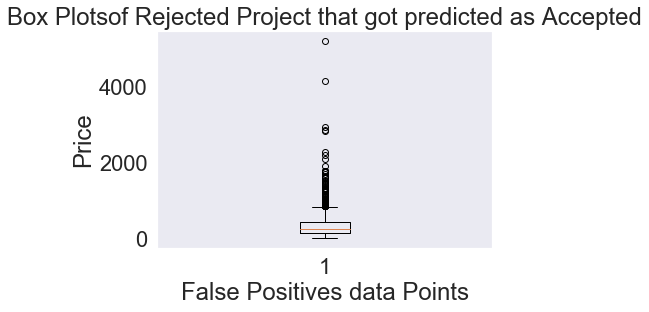

In [34]:
df2 = pd.DataFrame(X_test['price'])
df2_final = df2.iloc[false_positives,:]
plt.boxplot(df2_final.values)
plt.title('Box Plotsof Rejected Project that got predicted as Accepted')
plt.xlabel('False Positives data Points')
plt.ylabel('Price')
plt.grid()
plt.show()

# PDF For false positive data points

In [35]:
df3 = pd.DataFrame(X_test['teacher_number_of_previously_posted_projects'])
df3_final = df3.iloc[false_positives,:]

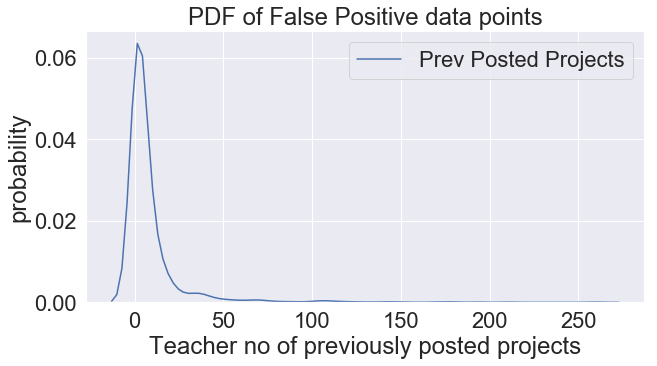

In [36]:
plt.figure(figsize=(10,5))
sns.distplot(df3_final.values, hist=False, label="Prev Posted Projects")
plt.title('PDF of False Positive data points')
plt.xlabel('Teacher no of previously posted projects')
plt.ylabel('probability')
plt.legend()
plt.show()

In [37]:
tfidf_feature_names = []

for a in vectorizer1.get_feature_names():
    tfidf_feature_names.append(a);
    
for a in vectorizer2.get_feature_names():
    tfidf_feature_names.append(a);

for a in vectorizer3.get_feature_names():
    tfidf_feature_names.append(a);

for a in vectorizer4.get_feature_names():
    tfidf_feature_names.append(a);
    
for a in vectorizer5.get_feature_names():
    tfidf_feature_names.append(a);

tfidf_feature_names.append('Price');
tfidf_feature_names.append('Quantity');
tfidf_feature_names.append('teacher_number_of_previously_posted_projects');
for a in vectorizer_tfidf_essay.get_feature_names():
    tfidf_feature_names.append(a)
    
for a in vectorizer_tfidf_titles.get_feature_names():
    tfidf_feature_names.append(a)
print(len(tfidf_feature_names))

6743


In [39]:
#https://stackoverflow.com/questions/27817994/visualizing-decision-tree-in-scikit-learn
#https://graphviz.readthedocs.io/en/stable/manual.html#subgraphs

import os 
os.environ["PATH"] += os.pathsep + r'C:\Users\Nishu\Anaconda3\Library\bin\graphviz-2.38\release\bin'
import graphviz
from sklearn import tree
from graphviz import Source

dot_data = tree.export_graphviz(model, out_file=None, feature_names=tfidf_feature_names)
graph = graphviz.Source(dot_data) 
graph.render("tfidf tree",view = True)


'tfidf tree.pdf'

# Set 3: categorical, numerical features + project_title(AVG W2V)+ preprocessed_eassay (AVG W2V)

In [22]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((categories_one_hot_train,sub_categories_one_hot_train,state_one_hot_train,prefix_one_hot_train,grade_cat_one_hot_train,price_standardized_train,quantity_standardized_train,prev_proj_standardized_train,titles_avg_w2v_vectors_train,essay_avg_w2v_vectors_train)).tocsr()
#X_cr = hstack((categories_one_hot_cv,sub_categories_one_hot_cv,state_one_hot_cv,prefix_one_hot_cv,grade_cat_one_hot_cv,price_standardized_cv,quantity_standardized_cv,prev_proj_standardized_cv,titles_avg_w2v_vectors_cv,essay_avg_w2v_vectors_cv)).tocsr()
X_te = hstack((categories_one_hot_test,sub_categories_one_hot_test,state_one_hot_test,prefix_one_hot_test,grade_cat_one_hot_test,price_standardized_test,quantity_standardized_test,prev_proj_standardized_test,essay_avg_w2v_vectors_test,titles_avg_w2v_vectors_test)).tocsr()
#np.savetxt("X_tr.csv", X_tr, delimiter=",")
#np.savetxt("X_cr.csv", X_cr, delimiter=",")
#np.savetxt("X_te.csv", X_te, fmt='%5s',delimiter=",")
from scipy import sparse
#Save the sparse matrix to avoid memory error
sparse.save_npz("X_tr_avgw2v_DT.npz", X_tr)
sparse.save_npz("X_te_avgw2v_DT.npz", X_te)
print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_te.shape, y_test.shape)

Final Data matrix
(33500, 703) (33500,)
(16500, 703) (16500,)


In [23]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import math
DT = DecisionTreeClassifier()
logAlpha = []
parameters = {'max_depth':[1, 5, 10, 50, 100, 500], 'min_samples_split': [5, 10, 100, 500]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(X_tr, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']


In [24]:
#display the best params
best_params = clf.best_estimator_
print("Best max_depth value for bow encoded text features is,",best_params)

Best max_depth value for bow encoded text features is, DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


# min_samples_split=500

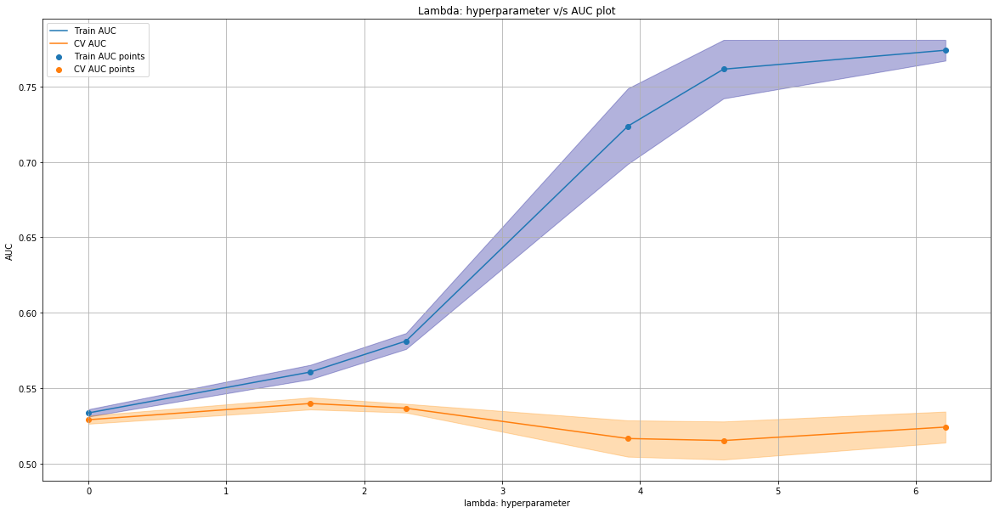

In [25]:
DT = DecisionTreeClassifier()
logAlpha = []
parameters = {'max_depth':[1, 5, 10, 50, 100, 500], 'min_samples_split': [500]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(X_tr, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']
plt.figure(figsize=(20,10))
plt.plot(np.log(parameters['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.3,color='darkblue')
plt.plot(np.log(parameters['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.3,color='darkorange')
plt.scatter(np.log(parameters['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(parameters['max_depth']), cv_auc, label='CV AUC points')
plt.legend()
plt.xlabel("lambda: hyperparameter")
plt.ylabel("AUC")
plt.title("Lambda: hyperparameter v/s AUC plot")
plt.grid()

# Observation:-

# Best Hyperparameter(max_depth)= 5 when min_samples_split=500


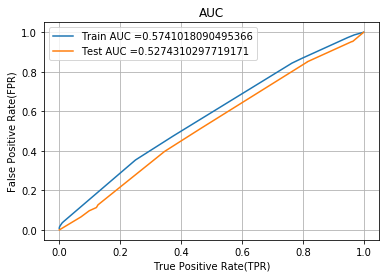

In [29]:
# https://scikitlearn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
model = DecisionTreeClassifier(min_samples_split = 500, max_depth= 5, class_weight='balanced')
model.fit(X_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positiveclass
# not the predicted outputs
y_train_pred = model.predict_proba(X_tr)[:,1]
y_test_pred = model.predict_proba(X_te)[:,1]
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC")
plt.grid()

# Observation:-

# Train AUC = 57%
# Test AUC = 52%


Accuracy on train set: 49.851%
Precision on train set: 0.877
Recall on train set: 0.476
F1-Score on train set: 0.617
Confusion Matrix of train set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 374 ms


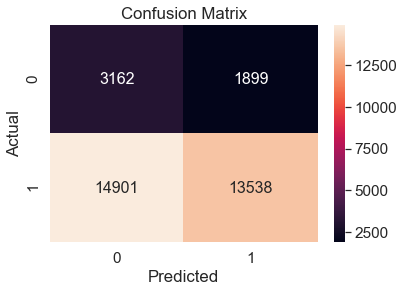

In [32]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_train_pred,train_fpr, train_tpr, tr_thresholds)
#print(y_pred_new)
classes = ['Actual', 'Predicted']
print("Accuracy on train set: %0.3f%%"%(accuracy_score(y_train, y_pred_new)*100))
print("Precision on train set: %0.3f"%(precision_score(y_train, y_pred_new)))
print("Recall on train set: %0.3f"%(recall_score(y_train, y_pred_new)))
print("F1-Score on train set: %0.3f"%(f1_score(y_train, y_pred_new)))
print("Confusion Matrix of train set:\n [ [TN  FP]\n [FN TP] ]\n")
cm =confusion_matrix(y_train, y_pred_new)
df_cm = pd.DataFrame(cm, range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

Accuracy on test set: 23.952%
Precision on test set: 0.849
Recall on test set: 0.127
F1-Score on test set: 0.221
Confusion Matrix of test set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 276 ms


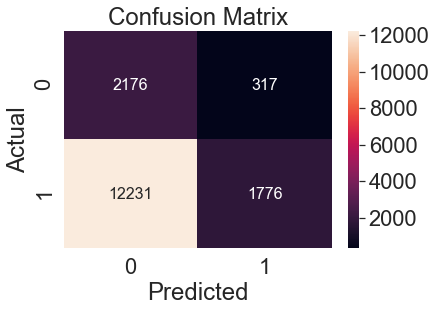

In [33]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_test_pred,test_fpr, test_tpr, tr_thresholds)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred_new)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred_new)))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred_new)))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred_new)))
print("Confusion Matrix of test set:\n [ [TN  FP]\n [FN TP] ]\n")

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred_new), range(2),range(2))
sns.set(font_scale=2.0)#for label size
sns.heatmap(df_cm,annot=True,annot_kws={"size": 16},fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

# WordCloud For False Positive data points

In [34]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
indices = []
test_predict = pd.DataFrame(predict(y_test_pred, te_thresholds, test_fpr, test_tpr))
test_actual = pd.DataFrame(y_test)

test_predict.columns = ['predicted_label']
test_actual.columns = ['actual_label']


test_predict.index = test_actual.index

df = test_actual.merge(test_predict, left_index=True, right_index=True)

dx = df[df['predicted_label']==1]
dy = dx[dx['actual_label'] == 0]
df1 = pd.DataFrame(dy)

indices.extend(df1.index)
print(indices[0])

0


In [35]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
text= []
for i  in range (0,len(indices)):
  text.append(project_data.clean_essays[indices[i]])
 
all_text = []

all_text.append(str(text))

all_text

["['my students respectful young adults first second generation families the majority raised work hard achieve parents not opportunity they kind hearted generous 89 students receive free reduced price lunch most would not even considered middle class they far behind race gap continues grow kids not get pick grow these kids read broken system forced i hear regularly ask why us each summer i take look book award lists previous year make sure i stock book award winners finalists many different categories genres this year stretches latest novel jaqueline woodson nonfiction pieces vietnam war if give students award winning texts increase chances producing higher quality work it exciting get boxes new books my kids always say like christmas september new books arrive many hand used materials something special smell new book knowing first soul lick finger flip pages nannan', nan, nan, nan, 'my curious investigative kindergarten students walk public school day thousands upon thousands question

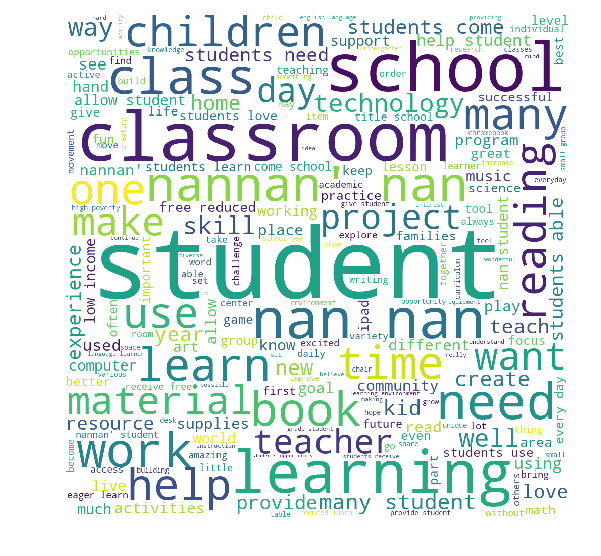

In [36]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
tn, fp, fn, tp = confusion_matrix(y_test, predict(y_test_pred, te_thresholds, test_fpr, test_tpr)).ravel()

from wordcloud import WordCloud


wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white',  
                min_font_size = 5).generate(all_text[0]) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

# Box Plot For false positive data points

In [37]:

def perf_measure(y_actual, y_hat):
    fp_index = []

    for i in range(len(y_hat)): 
        if y_hat[i]==1 and y_actual[i]!=y_hat[i]:
           fp_index.append(i)

    return(fp_index)

In [38]:
false_positives = perf_measure(y_test,y_pred_new)
len(false_positives)

317

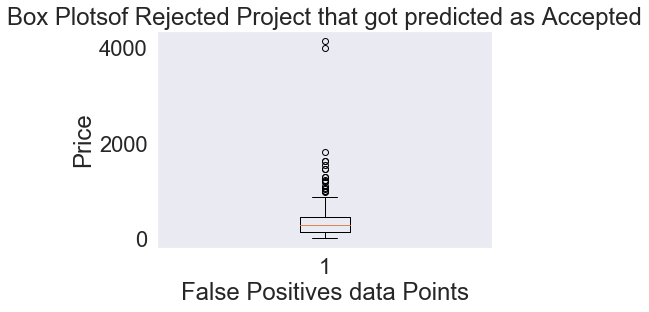

In [39]:
df2 = pd.DataFrame(X_test['price'])
df2_final = df2.iloc[false_positives,:]
plt.boxplot(df2_final.values)
plt.title('Box Plotsof Rejected Project that got predicted as Accepted')
plt.xlabel('False Positives data Points')
plt.ylabel('Price')
plt.grid()
plt.show()

# PDF For false positive data points

In [40]:
df3 = pd.DataFrame(X_test['teacher_number_of_previously_posted_projects'])
df3_final = df3.iloc[false_positives,:]

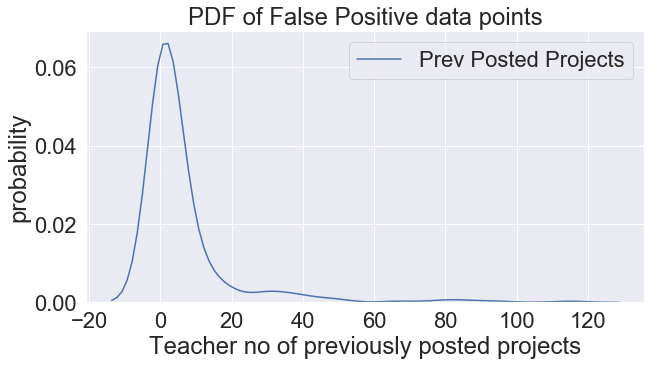

In [41]:
plt.figure(figsize=(10,5))
sns.distplot(df3_final.values, hist=False, label="Prev Posted Projects")
plt.title('PDF of False Positive data points')
plt.xlabel('Teacher no of previously posted projects')
plt.ylabel('probability')
plt.legend()
plt.show()

# Set 4: categorical, numerical features + project_title(TFIDF W2V)+ preprocessed_essay (TFIDF W2V)

In [23]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((categories_one_hot_train,sub_categories_one_hot_train,state_one_hot_train,prefix_one_hot_train,grade_cat_one_hot_train,price_standardized_train,quantity_standardized_train,prev_proj_standardized_train,title_tfidf_w2v_vectors_train,essay_tfidf_w2v_vectors_train)).tocsr()
#X_cr = hstack((categories_one_hot_cv,sub_categories_one_hot_cv,state_one_hot_cv,prefix_one_hot_cv,grade_cat_one_hot_cv,price_standardized_cv,quantity_standardized_cv,prev_proj_standardized_cv,title_tfidf_w2v_vectors_cv,essay_tfidf_w2v_vectors_cv)).tocsr()
X_te = hstack((categories_one_hot_test,sub_categories_one_hot_test,state_one_hot_test,prefix_one_hot_test,grade_cat_one_hot_test,price_standardized_test,quantity_standardized_test,prev_proj_standardized_test,essay_tfidf_w2v_vectors_test,title_tfidf_w2v_vectors_test)).tocsr()

#np.savetxt("X_tr.csv", X_tr, delimiter=",")
#np.savetxt("X_cr.csv", X_cr, delimiter=",")
#np.savetxt("X_te.csv", X_te, fmt='%5s',delimiter=",")
from scipy import sparse
#Save the sparse matrix to avoid memory error
sparse.save_npz("X_tr_tfidf_avgw2v_DT.npz", X_tr)
sparse.save_npz("X_te_tfidf_avgw2v_DT.npz", X_te)
print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_te.shape, y_test.shape)

Final Data matrix
(33500, 703) (33500,)
(16500, 703) (16500,)


In [24]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import math
DT = DecisionTreeClassifier()
logAlpha = []
parameters = {'max_depth':[1, 5, 10, 50, 100, 500], 'min_samples_split': [5, 10, 100, 500]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(X_tr, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']

In [25]:
#display the best params
best_params = clf.best_estimator_
print("Best max_depth value for bow encoded text features is,",best_params)

Best max_depth value for bow encoded text features is, DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


# min_samples_split=500

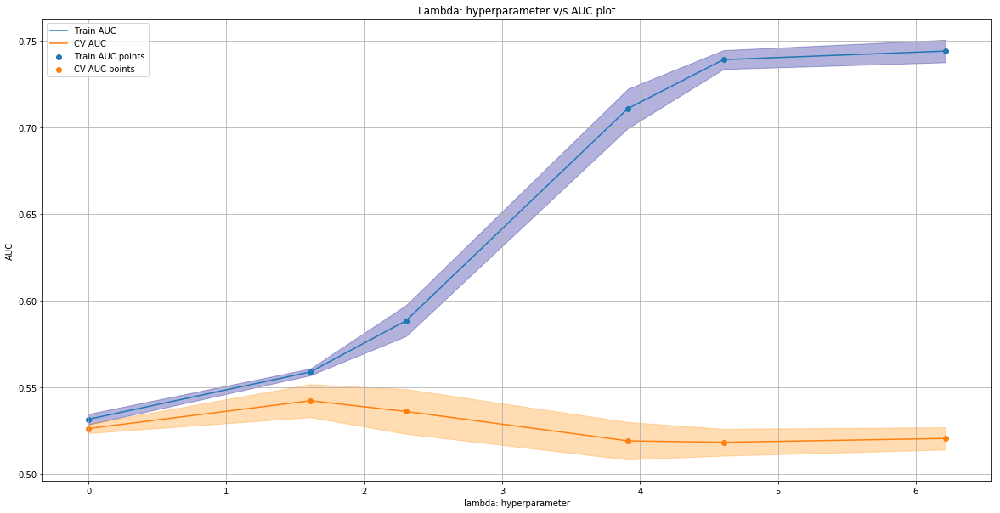

In [26]:
DT = DecisionTreeClassifier()
logAlpha = []
parameters = {'max_depth':[1, 5, 10, 50, 100, 500], 'min_samples_split': [500]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(X_tr, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']
plt.figure(figsize=(20,10))
plt.plot(np.log(parameters['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.3,color='darkblue')
plt.plot(np.log(parameters['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.3,color='darkorange')
plt.scatter(np.log(parameters['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(parameters['max_depth']), cv_auc, label='CV AUC points')
plt.legend()
plt.xlabel("lambda: hyperparameter")
plt.ylabel("AUC")
plt.title("Lambda: hyperparameter v/s AUC plot")
plt.grid()

# Observation:-

# Best Hyperparameter(max_depth)= 5 when min_samples_split=500


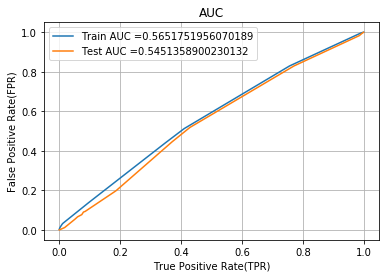

In [27]:
# https://scikitlearn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
model = DecisionTreeClassifier(min_samples_split = 500, max_depth= 5, class_weight='balanced')
model.fit(X_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positiveclass
# not the predicted outputs
y_train_pred = model.predict_proba(X_tr)[:,1]
y_test_pred = model.predict_proba(X_te)[:,1]
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC")
plt.grid()

# Observation

# Train AUC = 56%
# Test AUC = 54%

Accuracy on train set: 52.424%
Precision on train set: 0.875
Recall on train set: 0.513
F1-Score on train set: 0.647
Confusion Matrix of train set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 368 ms


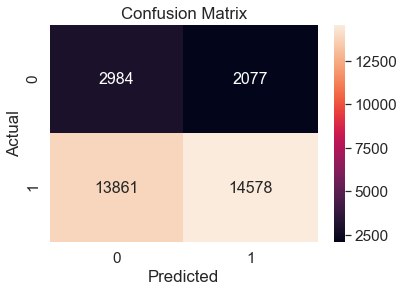

In [30]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_train_pred,train_fpr, train_tpr, tr_thresholds)
#print(y_pred_new)
classes = ['Actual', 'Predicted']
print("Accuracy on train set: %0.3f%%"%(accuracy_score(y_train, y_pred_new)*100))
print("Precision on train set: %0.3f"%(precision_score(y_train, y_pred_new)))
print("Recall on train set: %0.3f"%(recall_score(y_train, y_pred_new)))
print("F1-Score on train set: %0.3f"%(f1_score(y_train, y_pred_new)))
print("Confusion Matrix of train set:\n [ [TN  FP]\n [FN TP] ]\n")
cm =confusion_matrix(y_train, y_pred_new)
df_cm = pd.DataFrame(cm, range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

Accuracy on test set: 73.867%
Precision on test set: 0.858
Recall on test set: 0.829
F1-Score on test set: 0.843
Confusion Matrix of test set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 282 ms


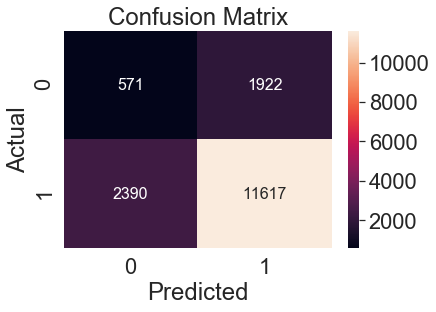

In [31]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_test_pred,test_fpr, test_tpr, tr_thresholds)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred_new)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred_new)))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred_new)))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred_new)))
print("Confusion Matrix of test set:\n [ [TN  FP]\n [FN TP] ]\n")

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred_new), range(2),range(2))
sns.set(font_scale=2.0)#for label size
sns.heatmap(df_cm,annot=True,annot_kws={"size": 16},fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

# WordCloud For false positive data points

In [32]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
indices = []
test_predict = pd.DataFrame(predict(y_test_pred, te_thresholds, test_fpr, test_tpr))
test_actual = pd.DataFrame(y_test)

test_predict.columns = ['predicted_label']
test_actual.columns = ['actual_label']


test_predict.index = test_actual.index

df = test_actual.merge(test_predict, left_index=True, right_index=True)

dx = df[df['predicted_label']==1]
dy = dx[dx['actual_label'] == 0]
df1 = pd.DataFrame(dy)

indices.extend(df1.index)
print(indices[0])

1


In [33]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
text= []
for i  in range (0,len(indices)):
  text.append(project_data.clean_essays[indices[i]])
 
all_text = []

all_text.append(str(text))

all_text

["['we school located outside tampa florida high poverty rate my students eclectic artistic they preteens full ambition emotions i serve one hundred fifty sixth graders science arts inclusion i lots kids english second language incorporating arts science allows students make meaningful connections learning fun learning difficult content we engage artistic expressions keen eye real science content i envision students small groups playing earth day games earthopoly play monopoly nature inspired themes earth bingo beautiful photographs part game this great i many visual learners the earth science skill games go many benchmark learnings earth processes earthquakes plate tectonics erosion etc playful game format i plan introduce games 2 weeks earth day provided project funded only students appreciate earth moved advocate protecting earth done one step time we make difference together please partner make project come life nannan', 'i teach math math intervention pinecrest academy st rose las

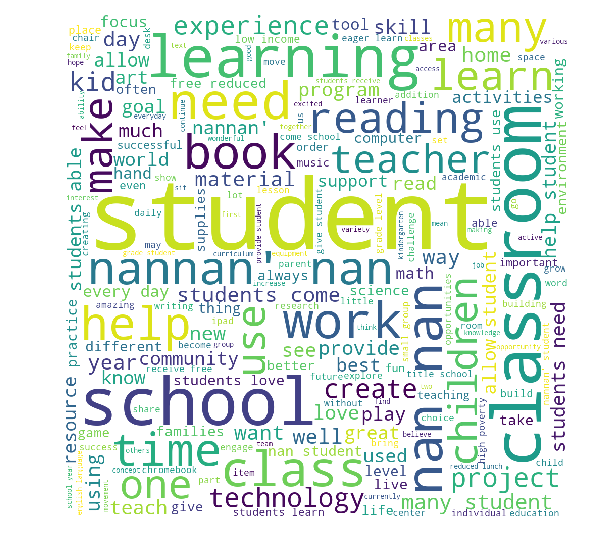

In [34]:
#https://github.com/philomath18/Decision-Tree---Donors-Choose
tn, fp, fn, tp = confusion_matrix(y_test, predict(y_test_pred, te_thresholds, test_fpr, test_tpr)).ravel()

from wordcloud import WordCloud


wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white',  
                min_font_size = 5).generate(all_text[0]) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

# Box Plot dor false positive data points

In [35]:
def perf_measure(y_actual, y_hat):
    fp_index = []

    for i in range(len(y_hat)): 
        if y_hat[i]==1 and y_actual[i]!=y_hat[i]:
           fp_index.append(i)

    return(fp_index)

In [36]:

false_positives = perf_measure(y_test,y_pred_new)
len(false_positives)


1922

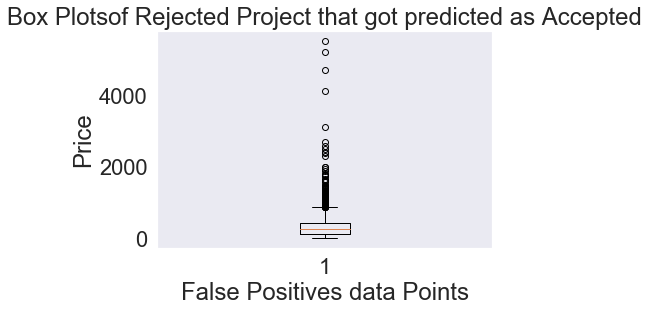

In [37]:
df2 = pd.DataFrame(X_test['price'])
df2_final = df2.iloc[false_positives,:]
plt.boxplot(df2_final.values)
plt.title('Box Plotsof Rejected Project that got predicted as Accepted')
plt.xlabel('False Positives data Points')
plt.ylabel('Price')
plt.grid()
plt.show()


# PDF for false positive data points

In [38]:

df3 = pd.DataFrame(X_test['teacher_number_of_previously_posted_projects'])
df3_final = df3.iloc[false_positives,:]

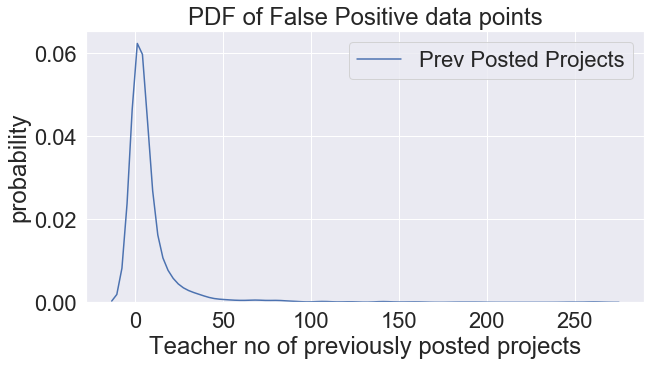

In [39]:
plt.figure(figsize=(10,5))
sns.distplot(df3_final.values, hist=False, label="Prev Posted Projects")
plt.title('PDF of False Positive data points')
plt.xlabel('Teacher no of previously posted projects')
plt.ylabel('probability')
plt.legend()
plt.show()



# 5. Task 2 :- Select 5k best features from features of Set 2 usingfeature_importances

In [21]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import math
DT = DecisionTreeClassifier()
parameters = {'max_depth':[1, 5, 10, 50, 100, 500], 'min_samples_split': [5, 10, 100, 500]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')

In [23]:
# https://stackoverflow.com/questions/48377296/get-feature-importance-from-gridsearchcv
# https://github.com/philomath18/Decision-Tree---Donors-Choose
def selectKImportance(model, X, k):
     return X[:,model.best_estimator_.feature_importances_.argsort()[::-1][:k]]
  
  
clf.fit(X_tr,y_train)

impdf = selectKImportance(clf,X_tr,5000)
impdf.shape


(33500, 5000)

In [24]:
clf.fit(X_te,y_test)

impdf_test = selectKImportance(clf,X_te,5000)
impdf_test.shape

(16500, 5000)

In [25]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import math
DT = DecisionTreeClassifier()
logAlpha = []
parameters = {'max_depth':[1, 5, 10, 50, 100, 500], 'min_samples_split': [5, 10, 100, 500]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(impdf, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']

In [26]:
#display the best params
best_params = clf.best_estimator_
print("Best max_depth value for bow encoded text features is,",best_params)

Best max_depth value for bow encoded text features is, DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=10,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


# min_samples_split=10

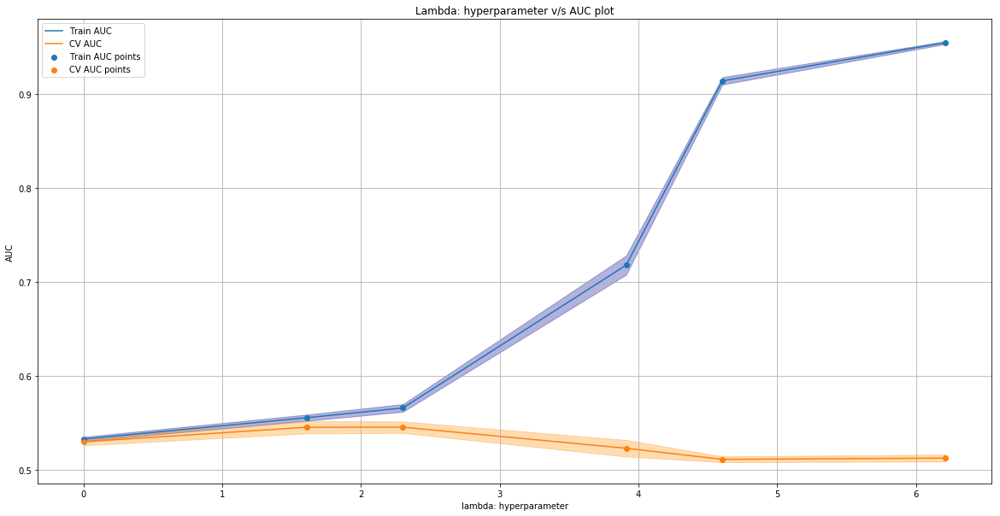

In [27]:
DT = DecisionTreeClassifier()
logAlpha = []
parameters = {'max_depth':[1, 5, 10, 50, 100, 500], 'min_samples_split': [10]}
clf = GridSearchCV(DT, parameters, cv= 3, scoring='roc_auc')
clf.fit(impdf, y_train)
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score']
cv_auc_std= clf.cv_results_['std_test_score']
plt.figure(figsize=(20,10))
plt.plot(np.log(parameters['max_depth']), train_auc, label='Train AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),train_auc - train_auc_std,train_auc + train_auc_std,alpha=0.3,color='darkblue')
plt.plot(np.log(parameters['max_depth']), cv_auc, label='CV AUC')
# this code is copied from here: https://stackoverflow.com/a/48803361/4084039
plt.gca().fill_between(np.log(parameters['max_depth']),cv_auc - cv_auc_std,cv_auc + cv_auc_std,alpha=0.3,color='darkorange')
plt.scatter(np.log(parameters['max_depth']), train_auc, label='Train AUC points')
plt.scatter(np.log(parameters['max_depth']), cv_auc, label='CV AUC points')
plt.legend()
plt.xlabel("lambda: hyperparameter")
plt.ylabel("AUC")
plt.title("Lambda: hyperparameter v/s AUC plot")
plt.grid()

# Observation:-

# Best Hyperparameter(max_depth)= 10 when min_samples_split=10


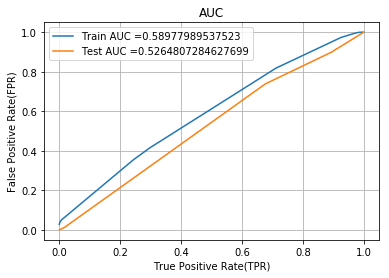

In [28]:
# https://scikitlearn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
model = DecisionTreeClassifier(min_samples_split = 10, max_depth= 10, class_weight='balanced')
model.fit(impdf, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positiveclass
# not the predicted outputs
y_train_pred = model.predict_proba(impdf)[:,1]
y_test_pred = model.predict_proba(impdf_test)[:,1]
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC")
plt.grid()

# Observation:-

# Train AUC = 58%
# Test AUC = 52%

Accuracy on train set: 45.806%
Precision on train set: 0.887
Recall on train set: 0.414
F1-Score on train set: 0.565
Confusion Matrix of train set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 367 ms


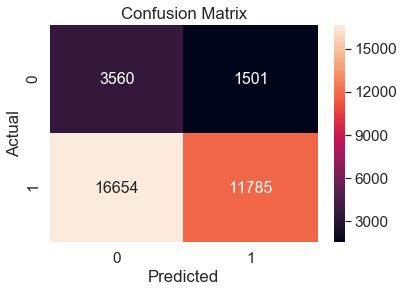

In [31]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_train_pred,train_fpr, train_tpr, tr_thresholds)
#print(y_pred_new)
classes = ['Actual', 'Predicted']
print("Accuracy on train set: %0.3f%%"%(accuracy_score(y_train, y_pred_new)*100))
print("Precision on train set: %0.3f"%(precision_score(y_train, y_pred_new)))
print("Recall on train set: %0.3f"%(recall_score(y_train, y_pred_new)))
print("F1-Score on train set: %0.3f"%(f1_score(y_train, y_pred_new)))
print("Confusion Matrix of train set:\n [ [TN  FP]\n [FN TP] ]\n")
cm =confusion_matrix(y_train, y_pred_new)
df_cm = pd.DataFrame(cm, range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

Accuracy on test set: 16.109%
Precision on test set: 0.816
Recall on test set: 0.015
F1-Score on test set: 0.030
Confusion Matrix of test set:
 [ [TN  FP]
 [FN TP] ]

Wall time: 247 ms


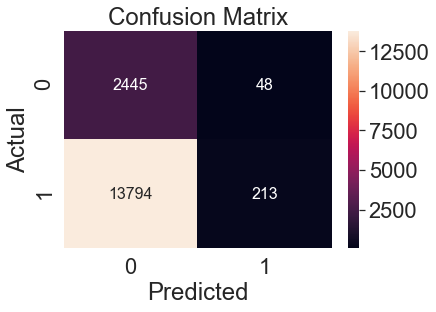

In [32]:
%%time
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

y_pred_new =predict(y_test_pred,test_fpr, test_tpr, tr_thresholds)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred_new)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred_new)))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred_new)))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred_new)))
print("Confusion Matrix of test set:\n [ [TN  FP]\n [FN TP] ]\n")

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred_new), range(2),range(2))
sns.set(font_scale=2.0)#for label size
sns.heatmap(df_cm,annot=True,annot_kws={"size": 16},fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

<h1>3. Conclusion</h1>

In [1]:
# Please compare all your models using Prettytable library
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Vectorizer","Hyper-parameter(Max_depth)","AUC"]
x.add_row(["BOW",10, 0.54])
x.add_row(["TFIDF",10, 0.54])
x.add_row(["Avg_W2V",5, 0.52])
x.add_row(["TFIDF_W2V",5, 0.54])
x.add_row(["TFIDF_5000_best_features",10,0.52])
print(x)

+--------------------------+----------------------------+------+
|        Vectorizer        | Hyper-parameter(Max_depth) | AUC  |
+--------------------------+----------------------------+------+
|           BOW            |             10             | 0.54 |
|          TFIDF           |             10             | 0.54 |
|         Avg_W2V          |             5              | 0.52 |
|        TFIDF_W2V         |             5              | 0.54 |
| TFIDF_5000_best_features |             10             | 0.52 |
+--------------------------+----------------------------+------+


# Observations

# Taken 50k points to avoid memory error
# The results are similar for all the sets
# None of the model gave high accuracy
# Some cases accuracy in test data is higher than train data
# Our model with 5k features could not increase accuracy
# Due to less training data consideration,  models are not performing accurately.